In [141]:
import os
import shutil
import  joblib
import numpy as np
import pandas as pd
import librosa as lb
import librosa.display
import matplotlib.pyplot as plt

from pathlib import Path
from tqdm.notebook import tqdm
import IPython.display

import noisereduce as nr
from matplotlib import pyplot as plt
from scipy.ndimage import maximum_filter1d

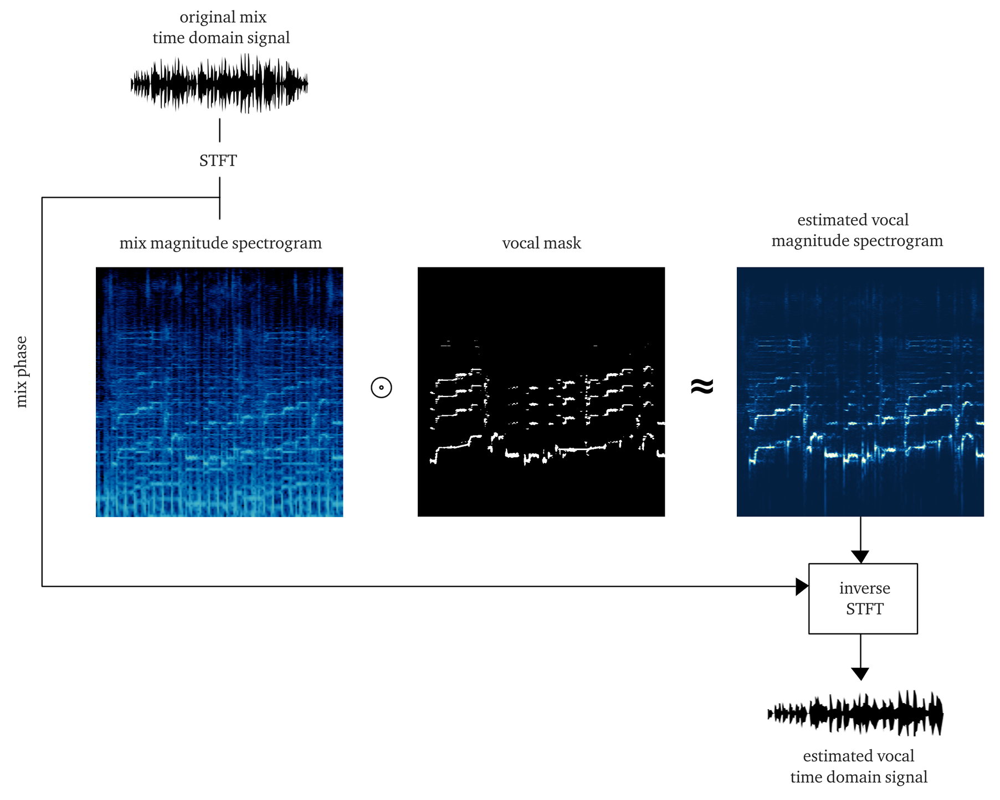

In [143]:
from IPython import display
#os.makedirs("/Users/michliu/Documents/HSBC - Data scientist")
display.Image("/Users/michliu/Documents/HSBC - Data scientist/Masking.png")

In [ ]:
/Users/michliu/Documents/HSBC - Data scientist/Masking.png

In [142]:
import os
cwd = os.getcwd()
cwd

'/Users/michliu/Documents/HSBC - Data scientist/audio/cantonese2'

In [123]:
os. chdir('/Users/michliu/Documents/HSBC - Data scientist/audio/cantonese2/') 

Steps of algorithm

1. An FFT is calculated over the noise audio clip
2. Statistics are calculated over FFT of the the noise (in frequency)
3. A threshold is calculated based upon the statistics of the noise (and the desired sensitivity of the algorithm)
4. An FFT is calculated over the signal
5. A mask is determined by comparing the signal FFT to the threshold
6. The mask is smoothed with a filter over frequency and time
7. The mask is appled to the FFT of the signal, and is inverted

n_grad_freq (int): how many frequency channels to smooth over with the mask.
n_grad_time (int): how many time channels to smooth over with the mask.
n_fft (int): number audio of frames between STFT columns.
win_length (int): Each frame of audio is windowed by `window()`. The window will be of length `win_length` and then padded with zeros to match `n_fft`..
hop_length (int):number audio of frames between STFT columns.
n_std_thresh (int): how many standard deviations louder than the mean dB of the noise (at each frequency level) to be considered signal
prop_decrease (float): To what extent should you decrease noise (1 = all, 0 = none)
pad_clipping (bool): Pad the signals with zeros to ensure that the reconstructed data is equal length to the data
        use_tensorflow (bool): Use tensorflow as a backend for convolution and fft to speed up computation
verbose (bool): Whether to plot the steps of the algorithm

Source: https://pypi.org/project/noisereduce/
Source: https://timsainburg.com/noise-reduction-python.html

In [124]:
DATA_ROOT = Path("/Users/michliu/Documents/HSBC - Data scientist/audio/cantonese2")
TRAIN_AUDIO_ROOT = Path("/Users/michliu/Documents/HSBC - Data scientist/audio/cantonese2/NoisySpeech_training")
#TEST_AUDIO_ROOT = Path("/Users/michliu/Documents/HSBC - Data scientist/audio/cantonese/NoisySpeech_testing")

In [125]:
df_audio = pd.DataFrame({
    "recording_id": [path.stem for path in Path(TRAIN_AUDIO_ROOT).glob("*.wav")],
})

In [126]:
df_audio.head()

,recording_id
0,noisy_Cantonese4_SNRdb_20_Field_1
1,noisy_Cantonese2_SNRdb_10_AirportAnnouncements_5
2,noisy_Cantonese3_SNRdb_30_AirportAnnouncements_3
3,noisy_Cantonese3_SNRdb_30_AirConditioner_4
4,noisy_Cantonese2_SNRdb_30_Typing_2


In [127]:
class params:
    """
    Parameters used for the audio data
    """
    sr = 44100

    # Melspectrogram
    n_mels = 128
    fmin = 20
    fmax = sr // 2  # Shannon theorem

In [128]:
def load_audio(record, sr=16000, root=""):
    y, _ = lb.load(
        root.joinpath(record).with_suffix(".wav").as_posix(),
        sr=sr, 
    )
    return y

In [129]:
def compute_melspec(y, params):
    """
    Computes a mel-spectrogram and puts it at decibel scale
    Arguments:
        y {np array} -- signal
        params {AudioParams} -- Parameters to use for the spectrogram. Expected to have the attributes sr, n_mels, f_min, f_max
    Returns:
        np array -- Mel-spectrogram
    """
    melspec = lb.feature.melspectrogram(
        y, sr=params.sr, n_mels=params.n_mels, fmin=params.fmin, fmax=params.fmax,
    )

    melspec = lb.power_to_db(melspec).astype(np.float32)
    return melspec

In [144]:
# Example

y = load_audio(df_audio["recording_id"][2], params.sr, TRAIN_AUDIO_ROOT)
IPython.display.Audio(y, rate=params.sr)

In [131]:
# Denoise
# I detect point no human voice by using Sound Envelope.
def envelope(y, rate, threshold):
    mask = []
    y_mean = maximum_filter1d(np.abs(y), mode="constant", size=rate//20)
    for mean in y_mean:
        if mean > threshold:
            mask.append(True)
        else:
            mask.append(False)
    return mask, y_mean

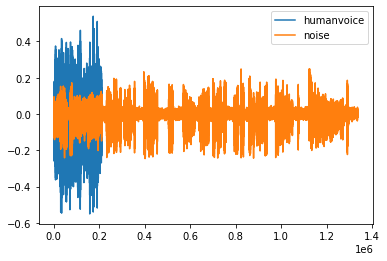

In [145]:
thr = 0.25
mask, env = envelope(y, params.sr, thr)

plt.plot(y[mask], label="humanvoice")
plt.plot(y[np.logical_not(mask)], label="noise")
plt.legend(bbox_to_anchor=(1, 1), loc='upper right')

  0%|          | 0/7 [00:00<?, ?it/s]

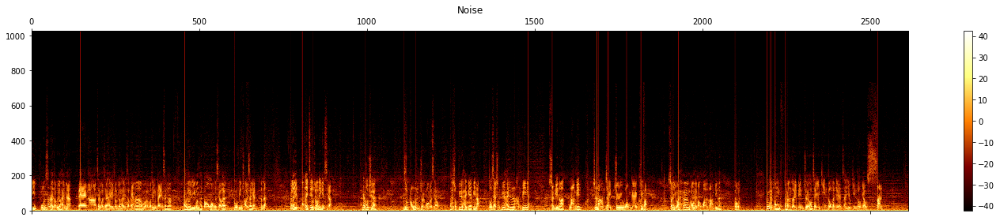

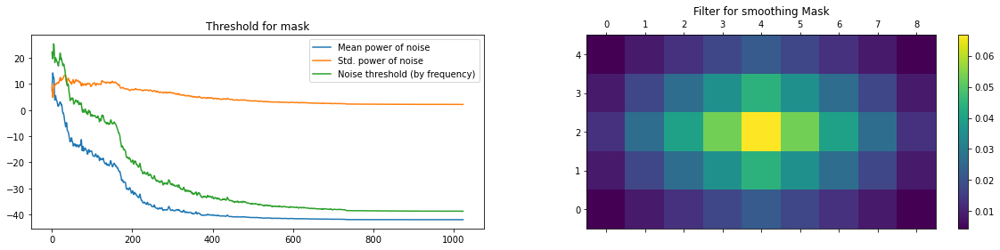

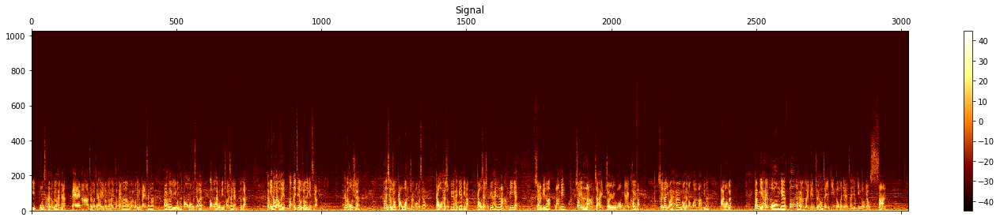

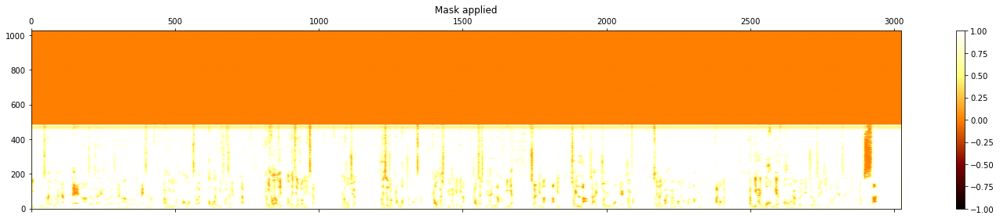

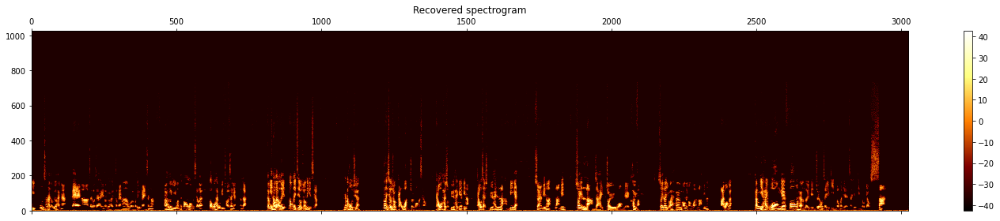

In [146]:
# denoise and check denoise sound
y_denoise = nr.reduce_noise(audio_clip=y, noise_clip=y[np.logical_not(mask)], verbose=True)

# spectogram: x axis is time, y axis is frequencies. The intensity of different colours shows how loud is the song in different frequencies nad time 


In [147]:
IPython.display.Audio(y_denoise, rate=params.sr)

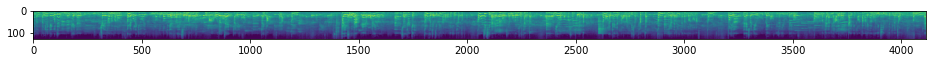

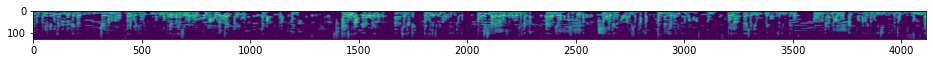

In [135]:
def tmp_audio_to_spec(audio, sr):
    spec = librosa.power_to_db(
        librosa.feature.melspectrogram(audio, sr=sr, fmin=20, fmax=16000, n_mels=128)
    )
    return spec.astype(np.float32)

plt.figure(figsize=(16, 8))
plt.imshow(tmp_audio_to_spec(y, params.sr))
plt.show()

plt.figure(figsize=(16, 8))
plt.imshow(tmp_audio_to_spec(y_denoise, params.sr))
plt.show()

It seems that noise has been removed.

### Process all audios

In [136]:
# Funtion to write audio    
import soundfile as sf
def audiowrite(data, fs, destpath, norm=False):
    if norm:
        rms = (data ** 2).mean() ** 0.5
        scalar = 10 ** (-25 / 10) / (rms+eps)
        data = data * scalar
        if max(abs(data))>=1:
            data = data/max(abs(data), eps)
    
    destpath = os.path.abspath(destpath)
    destdir = os.path.dirname(destpath)
    
    if not os.path.exists(destdir):
        os.makedirs(destdir)
    
    sf.write(destpath, data, fs)
    return

In [137]:
df_audio['recording_id'][0]

'noisy_Cantonese4_SNRdb_20_Field_1'

In [138]:
os.makedirs("Processed_train")

In [139]:
processedspeech_dir = "/Users/michliu/Documents/HSBC - Data scientist/audio/cantonese2/Processed_train/"

In [140]:
total_samples = len(df_audio)
print('total_samples', total_samples)
thr = 0.25
#num_samples = 0
    
for i in range(0,total_samples):
    y = load_audio(df_audio["recording_id"][i], params.sr, TRAIN_AUDIO_ROOT)
    
    mask, env = envelope(y, params.sr, thr)
    #noise_clip = y[np.logical_not(mask)]
    #if len(noise_clip):
    #    y = nr.reduce_noise(audio_clip=y, noise_clip=noise_clip, verbose=False)
    y_denoise = nr.reduce_noise(audio_clip=y, noise_clip=y[np.logical_not(mask)], verbose=False)
    filename = 'pr_'+df_audio["recording_id"][i]+'.wav'
    #print(filename)
    path = os.path.join(processedspeech_dir, filename)
    audiowrite(y_denoise, params.sr, path, norm=False)


total_samples 85
